In [4]:
%config InlineBackend.figure_format = 'retina'
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

savefilename = "stacked_naip_sample.tif"
data = rasterio.open(savefilename)

In [10]:
im = data.read()

This is a 4-band image: red, green, blue, infrared, as seen by the shape property:

In [13]:
im.shape

(4, 1149, 1506)

Plot the true color image (RGB):

In [18]:
im_rgb = im[0:3,:,:]

# Need to reorder the axes so that the channel axis is last
im_rgb = im_rgb.transpose(1,2,0)
im_rgb.shape


(1149, 1506, 3)

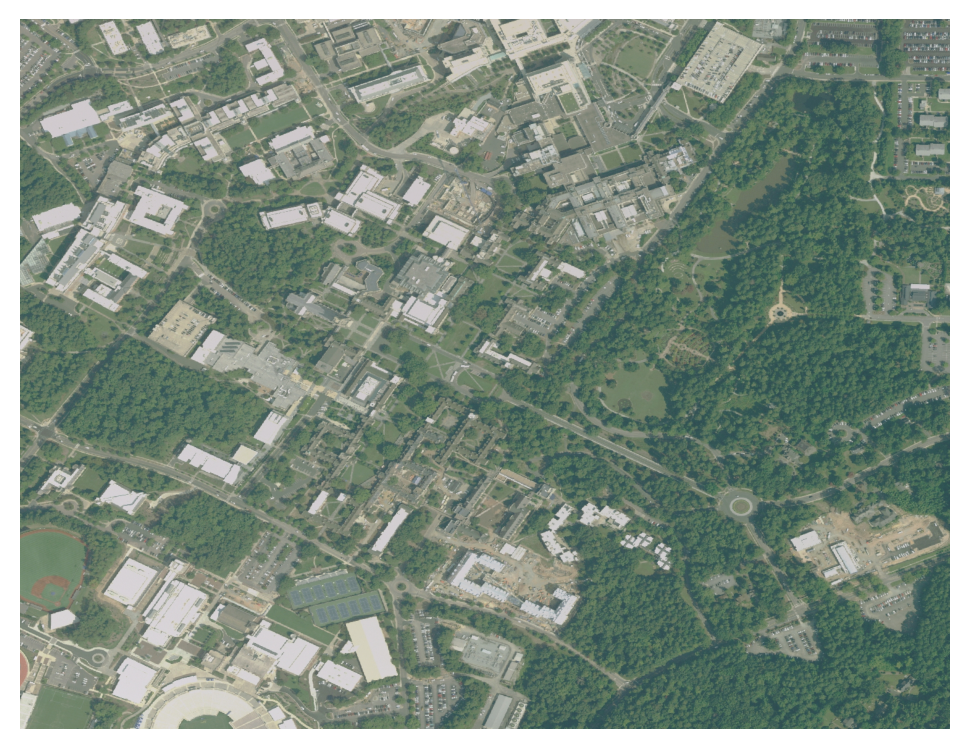

In [21]:

fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(im_rgb)
ax.set_axis_off()

Now, plot a false color version of the image:

In [22]:
im_false_color = im[[0,1,3],:,:]


In [23]:
im_false_color.shape

(3, 1149, 1506)

In [28]:
im_false_color = im_false_color[[2,1,0]]
im_false_color = im_false_color.transpose(1,2,0)
im_false_color.shape

(1149, 1506, 3)

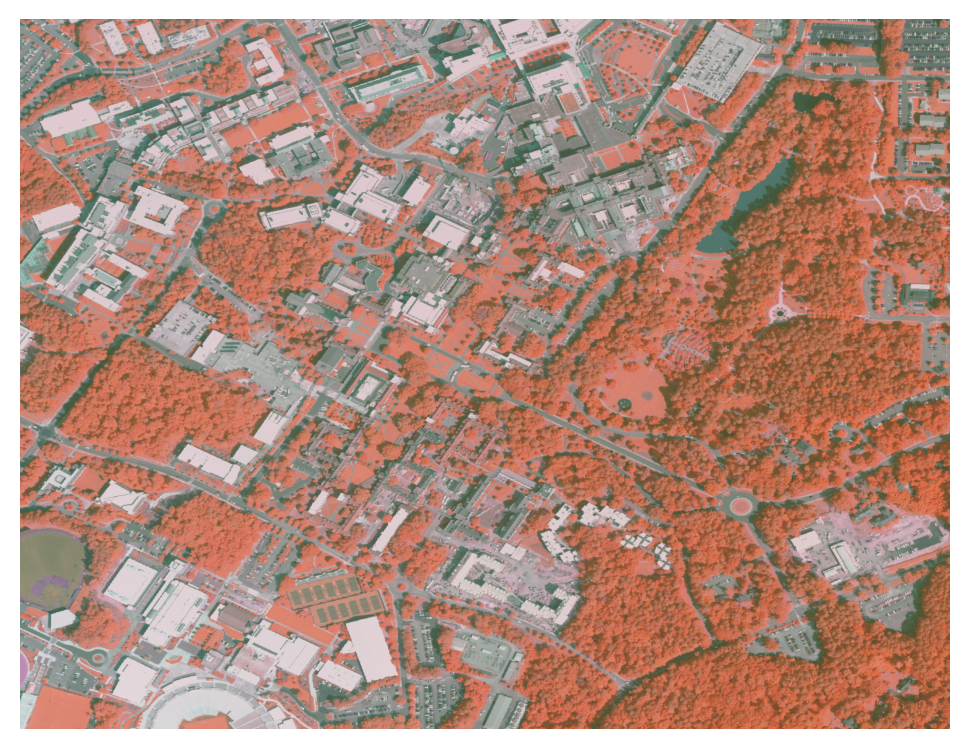

In [29]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(im_false_color)
ax.set_axis_off()

Each of these tasks can be easily done with rasterio as well:

(-78.94454005651106, -78.93101142833221, 35.995762929254454, 36.00608457186899)

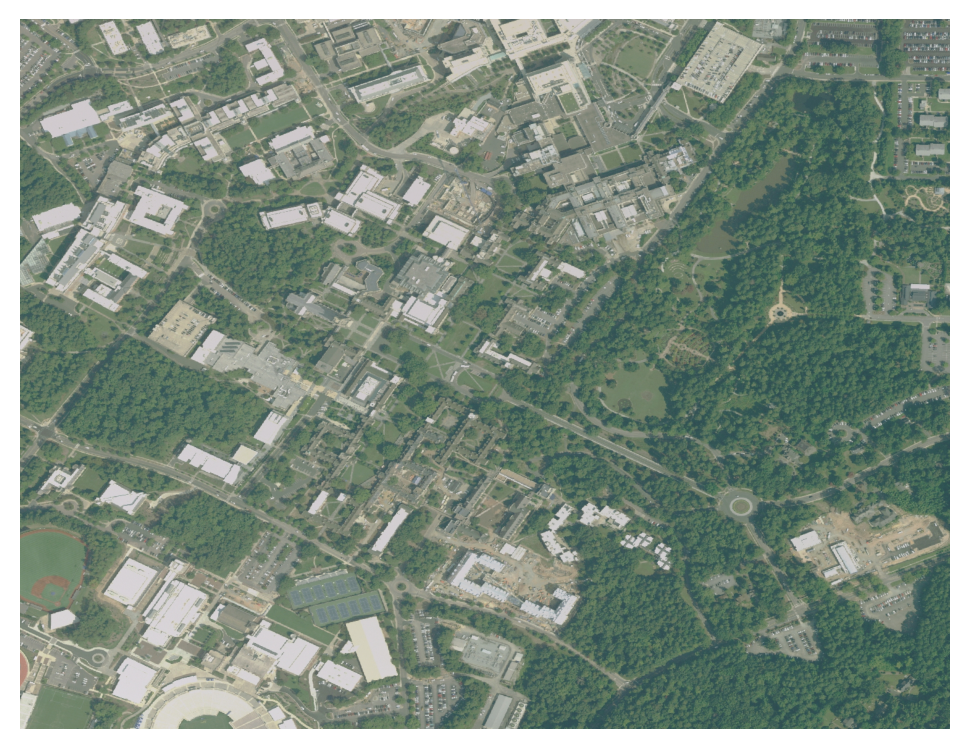

In [8]:
# View the image
fig, ax = plt.subplots(figsize=(6,6))

# View true color image:
show(data.read([1,2,3]).astype('float')/255, transform=data.transform, ax=ax)
plt.axis('off')


(-78.94454005651106, -78.93101142833221, 35.995762929254454, 36.00608457186899)

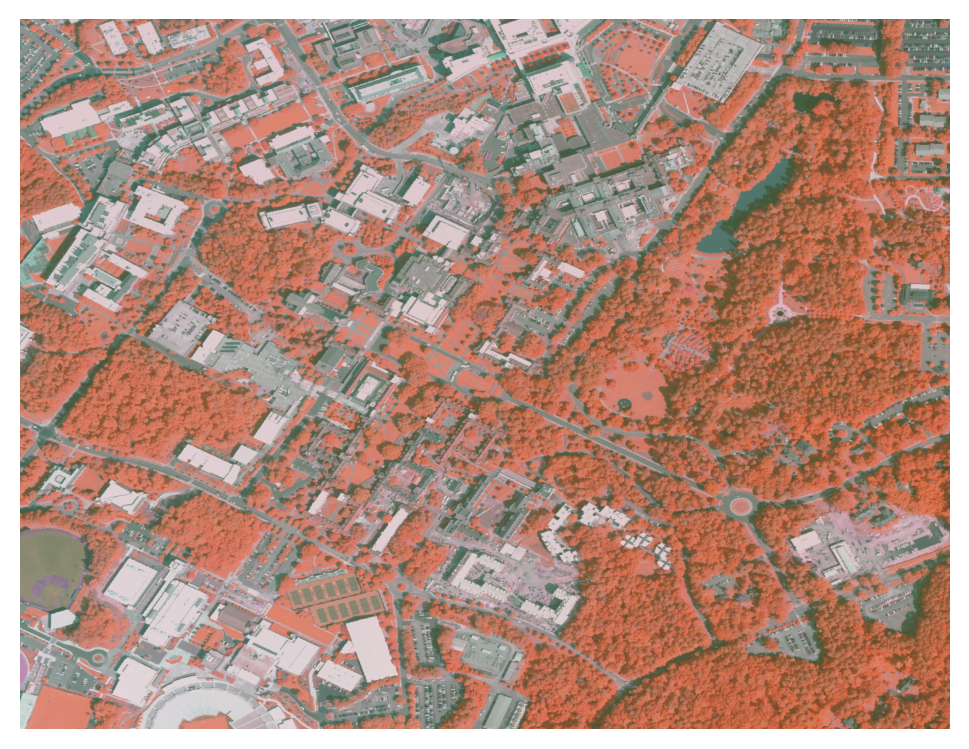

In [7]:
# View the image
fig, ax = plt.subplots(figsize=(6,6))
false_color_image = data.read([4,2,1])
# View a false color image:
show(data.read([4,2,1]).astype('float')/255, transform=data.transform, ax=ax)
plt.axis('off')

Now, let's get each channel as a separate array and calculate the NDVI:

In [31]:
[red, green, blue, infrared] = im
NDVI = (infrared-red)/(infrared+red)

/var/folders/m6/8k94r84d6qq_67mq2lnhvrzh0000gn/T/ipykernel_57889/2849855312.py:2: RuntimeWarning: divide by zero encountered in divide
  NDVI = (infrared-red)/(infrared+red)
/var/folders/m6/8k94r84d6qq_67mq2lnhvrzh0000gn/T/ipykernel_57889/2849855312.py:2: RuntimeWarning: invalid value encountered in divide
  NDVI = (infrared-red)/(infrared+red)


Oops! We have two issues here - the obvious one is that this currently produces a divide by zero, issue. In this case, so the results are messed up:

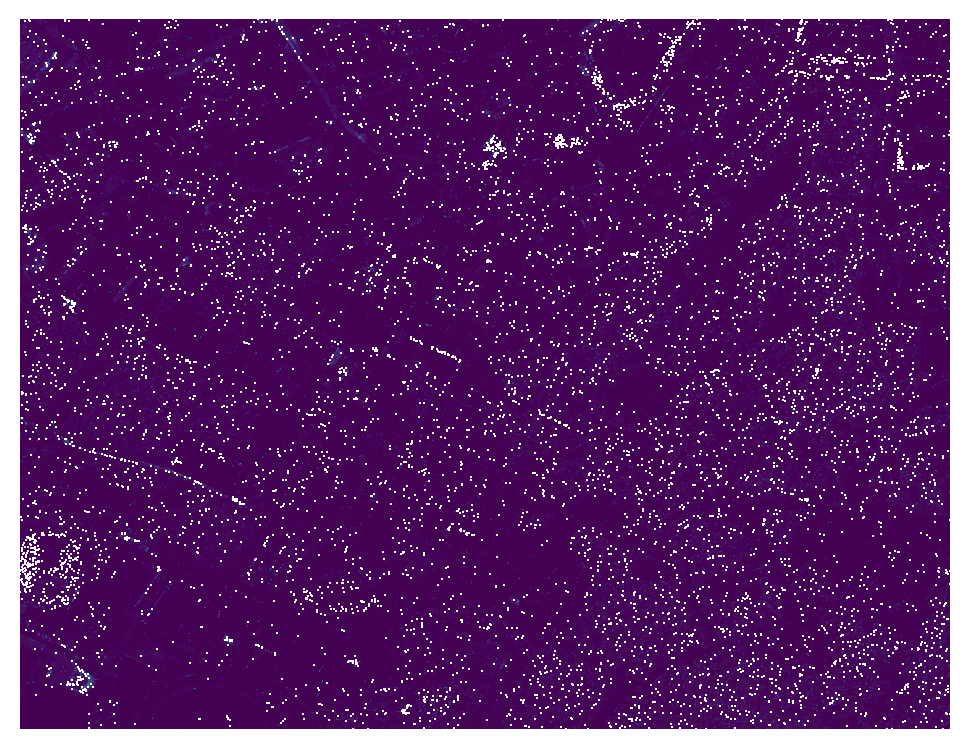

In [32]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(NDVI)
ax.set_axis_off()

The less obvious one is `im` is of type uint8, and so the operations above are incorrect.

In [49]:
im

array([[[ 91,  87,  89, ..., 100, 117, 128],
        [101, 104,  97, ..., 135, 134, 118],
        [111, 109, 117, ..., 153, 148, 147],
        ...,
        [217, 216, 212, ...,  57,  56,  57],
        [221, 221, 219, ...,  50,  65,  75],
        [212, 216, 219, ...,  54,  65,  82]],

       [[114, 112, 112, ..., 111, 127, 138],
        [119, 121, 120, ..., 158, 154, 133],
        [126, 122, 130, ..., 170, 163, 159],
        ...,
        [214, 213, 212, ...,  94,  93,  94],
        [217, 217, 216, ...,  86,  97, 107],
        [212, 216, 215, ...,  90,  97, 115]],

       [[ 94,  91,  92, ..., 105, 119, 130],
        [ 97, 102, 100, ..., 150, 145, 126],
        [103, 102, 110, ..., 162, 156, 149],
        ...,
        [205, 204, 200, ...,  87,  85,  86],
        [214, 214, 211, ...,  82,  84,  92],
        [202, 208, 212, ...,  78,  82,  98]],

       [[204, 193, 196, ...,  87, 106, 131],
        [199, 192, 193, ...,  84,  91, 102],
        [199, 193, 200, ..., 107,  98, 129],
        ..

Let's fix this:

In [52]:
[red, green, blue, infrared] = im.astype('float') # This takes care of the data type issue
numerator = infrared-red
denomenator = infrared+red
NDVI = numerator / (denomenator + 1e-5) # This prevents any true divide by zero issues

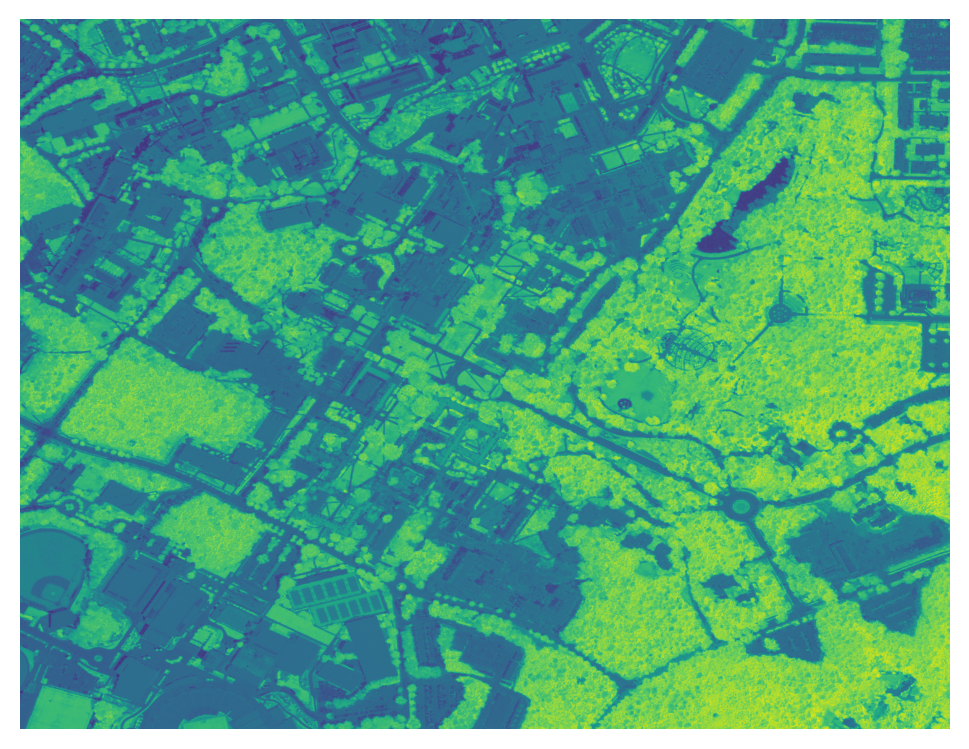

In [53]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(NDVI)
ax.set_axis_off()

These values range between the following:

In [54]:
NDVI.min()

-0.3258426844253677

In [55]:
NDVI.max()

0.6299212350424711

These can then be broken down into four general types of categories:

- Dense vegetation - Greater than or equal to 0.6
- Moderate vegetation - In the range [0.4, 0.6)
- Sparse vegetation - In the range [0.2 0.4)
- No vegetation - Below 0.2